<a href="https://colab.research.google.com/github/amhe1346/Computer-Vision/blob/main/1_image_predictor_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [43]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Object masks in images from prompts with SAM 2

Segment Anything Model 2 (SAM 2) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt.

The `SAM2ImagePredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/image_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [44]:
using_colab = False

In [45]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/groceries.jpg

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up

Necessary imports and helper functions for displaying points, boxes, and masks.

In [46]:
import os
# Fix OpenMP library conflict
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [47]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cpu


In [48]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

## Example image

In [49]:
# Use the image with various objects for this assignment - resize for faster processing
from PIL import Image as PILImage

pil_img = PILImage.open(r'C:\Users\aehee\OneDrive\computer vision\Segment ANything\18034887-big-collection-of-various-objects.jpg')
pil_img.thumbnail((640, 640), PILImage.Resampling.LANCZOS)
image = np.array(pil_img.convert("RGB"))
print(f"Image loaded and resized! Shape: {image.shape}")

Image loaded and resized! Shape: (586, 640, 3)


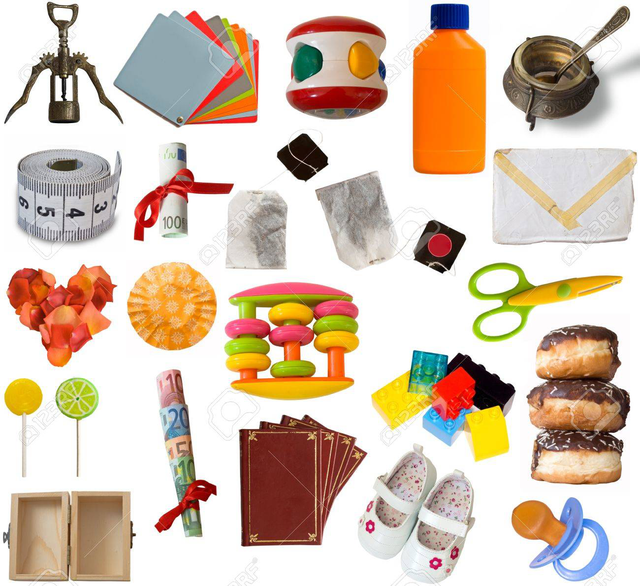

Image shape: (586, 640, 3)


In [50]:
# Display image using PIL instead of matplotlib to avoid crash
from PIL import Image as PILImage
display_img = PILImage.fromarray(image)
display(display_img)
print(f"Image shape: {image.shape}")

## ASSIGNMENT: Custom Object Segmentation with Multiple Prompts

In this section, we'll select at least 3 different objects from the image using point and box prompts.

In [51]:
# Load SAM 2 model and predictor for the assignment
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
predictor = SAM2ImagePredictor(sam2_model)

# Set the image for prediction
predictor.set_image(image)
print("Model loaded and image embedding computed!")

Model loaded and image embedding computed!


### Prompt 1: Point Prompt - Select Object in Top Left

Choose a point on an object in the upper-left area of the image.

In [52]:
# Prompt 1: Single point on an object (e.g., top-left area)
point1 = np.array([[150, 120]])  # x, y coordinates
label1 = np.array([1])  # 1 = foreground point

# Predict with multimask_output=True to get 3 masks
masks1, scores1, logits1 = predictor.predict(
    point_coords=point1,
    point_labels=label1,
    multimask_output=True,
)

# Sort by score
sorted_ind = np.argsort(scores1)[::-1]
masks1 = masks1[sorted_ind]
scores1 = scores1[sorted_ind]
logits1 = logits1[sorted_ind]

print(f"Prompt 1 - Point: {point1[0]}")
print(f"Generated {len(masks1)} masks with scores: {scores1}")
print(f"Best score: {scores1[0]:.4f}")

Prompt 1 - Point: [150 120]
Generated 3 masks with scores: [0.7798503  0.69988966 0.06387132]
Best score: 0.7799


Saved to: assignment_prompt1_results.png


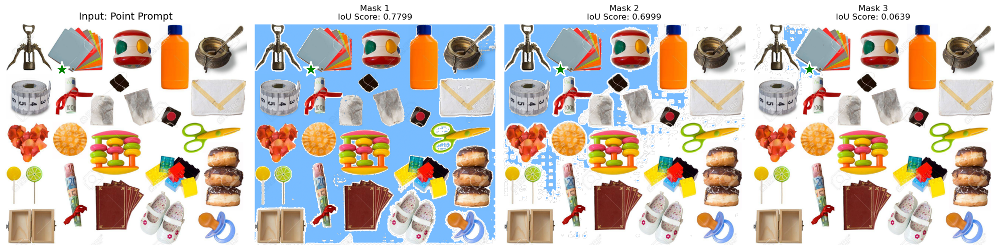

In [53]:
# Display Prompt 1: Show input point and 3 generated masks with scores
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Show original image with point
axes[0].imshow(image)
axes[0].scatter(point1[:, 0], point1[:, 1], color='green', marker='*', s=500, edgecolor='white', linewidth=2)
axes[0].set_title('Input: Point Prompt', fontsize=14)
axes[0].axis('off')

# Show 3 masks
for i in range(3):
    axes[i+1].imshow(image)
    show_mask(masks1[i], axes[i+1], random_color=False, borders=True)
    axes[i+1].scatter(point1[:, 0], point1[:, 1], color='green', marker='*', s=500, edgecolor='white', linewidth=2)
    axes[i+1].set_title(f'Mask {i+1}\nIoU Score: {scores1[i]:.4f}', fontsize=12)
    axes[i+1].axis('off')

plt.tight_layout()
plt.savefig('assignment_prompt1_results.png', bbox_inches='tight', dpi=150)
print("Saved to: assignment_prompt1_results.png")
plt.show()

### Prompt 2: Box Prompt - Select Object with Bounding Box

Draw a bounding box around an object in the center area.

In [54]:
# Prompt 2: Box prompt around an object (center area)
# Box format: [x_min, y_min, x_max, y_max]
box2 = np.array([300, 200, 450, 350])

# Predict with multimask_output=True
masks2, scores2, logits2 = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=box2[None, :],
    multimask_output=True,
)

# Sort by score
sorted_ind = np.argsort(scores2)[::-1]
masks2 = masks2[sorted_ind]
scores2 = scores2[sorted_ind]
logits2 = logits2[sorted_ind]

print(f"Prompt 2 - Box: {box2}")
print(f"Generated {len(masks2)} masks with scores: {scores2}")
print(f"Best score: {scores2[0]:.4f}")

Prompt 2 - Box: [300 200 450 350]
Generated 3 masks with scores: [0.4456402  0.3896196  0.07772683]
Best score: 0.4456


Saved to: assignment_prompt2_results.png


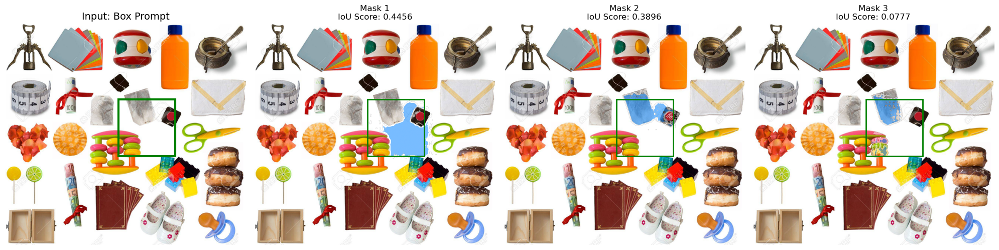

In [55]:
# Display Prompt 2: Show input box and 3 generated masks with scores
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Show original image with box
axes[0].imshow(image)
x0, y0 = box2[0], box2[1]
w, h = box2[2] - box2[0], box2[3] - box2[1]
rect = plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor='none', linewidth=3)
axes[0].add_patch(rect)
axes[0].set_title('Input: Box Prompt', fontsize=14)
axes[0].axis('off')

# Show 3 masks
for i in range(3):
    axes[i+1].imshow(image)
    show_mask(masks2[i], axes[i+1], random_color=False, borders=True)
    rect = plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor='none', linewidth=2)
    axes[i+1].add_patch(rect)
    axes[i+1].set_title(f'Mask {i+1}\nIoU Score: {scores2[i]:.4f}', fontsize=12)
    axes[i+1].axis('off')

plt.tight_layout()
plt.savefig('assignment_prompt2_results.png', bbox_inches='tight', dpi=150)
print("Saved to: assignment_prompt2_results.png")
plt.show()

### Prompt 3: Multiple Points - Select Object with Multiple Points

Use multiple foreground points to specify an object more precisely.

In [56]:
# Prompt 3: Multiple points on an object (right side of image)
point3 = np.array([
    [500, 250],  # Point 1
    [520, 280],  # Point 2
    [480, 310]   # Point 3
])
label3 = np.array([1, 1, 1])  # All foreground points

# Predict with multimask_output=True
masks3, scores3, logits3 = predictor.predict(
    point_coords=point3,
    point_labels=label3,
    multimask_output=True,
)

# Sort by score
sorted_ind = np.argsort(scores3)[::-1]
masks3 = masks3[sorted_ind]
scores3 = scores3[sorted_ind]
logits3 = logits3[sorted_ind]

print(f"Prompt 3 - Multiple Points:")
for i, pt in enumerate(point3):
    print(f"  Point {i+1}: {pt}")
print(f"Generated {len(masks3)} masks with scores: {scores3}")
print(f"Best score: {scores3[0]:.4f}")

Prompt 3 - Multiple Points:
  Point 1: [500 250]
  Point 2: [520 280]
  Point 3: [480 310]
Generated 3 masks with scores: [0.47762826 0.1834281  0.1291686 ]
Best score: 0.4776


Saved to: assignment_prompt3_results.png


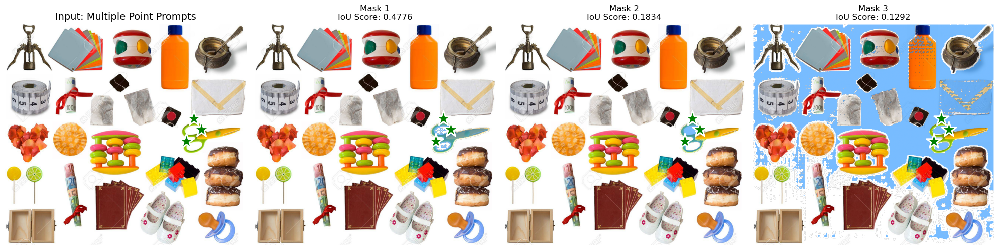

In [57]:
# Display Prompt 3: Show input points and 3 generated masks with scores
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Show original image with points
axes[0].imshow(image)
axes[0].scatter(point3[:, 0], point3[:, 1], color='green', marker='*', s=500, edgecolor='white', linewidth=2)
axes[0].set_title('Input: Multiple Point Prompts', fontsize=14)
axes[0].axis('off')

# Show 3 masks
for i in range(3):
    axes[i+1].imshow(image)
    show_mask(masks3[i], axes[i+1], random_color=False, borders=True)
    axes[i+1].scatter(point3[:, 0], point3[:, 1], color='green', marker='*', s=500, edgecolor='white', linewidth=2)
    axes[i+1].set_title(f'Mask {i+1}\nIoU Score: {scores3[i]:.4f}', fontsize=12)
    axes[i+1].axis('off')

plt.tight_layout()
plt.savefig('assignment_prompt3_results.png', bbox_inches='tight', dpi=150)
print("Saved to: assignment_prompt3_results.png")
plt.show()

### Prompt 4: Combined Point + Box - Precise Object Selection

Combine a bounding box with a point for more precise segmentation.

In [58]:
# Prompt 4: Combined box and point (bottom area)
box4 = np.array([100, 400, 280, 560])
point4 = np.array([[190, 480]])
label4 = np.array([1])  # Foreground point

# Predict with multimask_output=True
masks4, scores4, logits4 = predictor.predict(
    point_coords=point4,
    point_labels=label4,
    box=box4[None, :],
    multimask_output=True,
)

# Sort by score
sorted_ind = np.argsort(scores4)[::-1]
masks4 = masks4[sorted_ind]
scores4 = scores4[sorted_ind]
logits4 = logits4[sorted_ind]

print(f"Prompt 4 - Combined (Box + Point):")
print(f"  Box: {box4}")
print(f"  Point: {point4[0]}")
print(f"Generated {len(masks4)} masks with scores: {scores4}")
print(f"Best score: {scores4[0]:.4f}")

Prompt 4 - Combined (Box + Point):
  Box: [100 400 280 560]
  Point: [190 480]
Generated 3 masks with scores: [0.7318126  0.29192406 0.18243332]
Best score: 0.7318


Saved to: assignment_prompt4_results.png


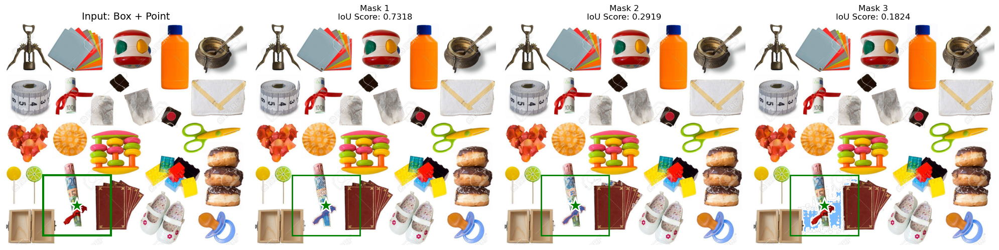

In [59]:
# Display Prompt 4: Show combined box+point and 3 generated masks with scores
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Show original image with box and point
axes[0].imshow(image)
x0, y0 = box4[0], box4[1]
w, h = box4[2] - box4[0], box4[3] - box4[1]
rect = plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor='none', linewidth=3)
axes[0].add_patch(rect)
axes[0].scatter(point4[:, 0], point4[:, 1], color='green', marker='*', s=500, edgecolor='white', linewidth=2)
axes[0].set_title('Input: Box + Point', fontsize=14)
axes[0].axis('off')

# Show 3 masks
for i in range(3):
    axes[i+1].imshow(image)
    show_mask(masks4[i], axes[i+1], random_color=False, borders=True)
    rect = plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor='none', linewidth=2)
    axes[i+1].add_patch(rect)
    axes[i+1].scatter(point4[:, 0], point4[:, 1], color='green', marker='*', s=500, edgecolor='white', linewidth=2)
    axes[i+1].set_title(f'Mask {i+1}\nIoU Score: {scores4[i]:.4f}', fontsize=12)
    axes[i+1].axis('off')

plt.tight_layout()
plt.savefig('assignment_prompt4_results.png', bbox_inches='tight', dpi=150)
print("Saved to: assignment_prompt4_results.png")
plt.show()

### Summary: Best Segmentation Scores from All Prompts

Compare the best IoU scores from all 4 prompts and display the overall best result.

In [60]:
# Summary of all prompts and their best scores
print("="*60)
print("ASSIGNMENT SUMMARY: Best IoU Scores from All Prompts")
print("="*60)

all_prompts = [
    ("Prompt 1: Single Point", scores1[0], masks1[0], point1, None),
    ("Prompt 2: Box", scores2[0], masks2[0], None, box2),
    ("Prompt 3: Multiple Points", scores3[0], masks3[0], point3, None),
    ("Prompt 4: Box + Point", scores4[0], masks4[0], point4, box4)
]

for i, (name, score, mask, points, box) in enumerate(all_prompts, 1):
    print(f"{i}. {name:30s} - Best IoU Score: {score:.4f}")

# Find the overall best
best_idx = np.argmax([p[1] for p in all_prompts])
best_name, best_score, best_mask, best_points, best_box = all_prompts[best_idx]

print("\n" + "="*60)
print(f"OVERALL BEST SEGMENTATION: {best_name}")
print(f"Best IoU Score: {best_score:.4f}")
print("="*60)

ASSIGNMENT SUMMARY: Best IoU Scores from All Prompts
1. Prompt 1: Single Point         - Best IoU Score: 0.7799
2. Prompt 2: Box                  - Best IoU Score: 0.4456
3. Prompt 3: Multiple Points      - Best IoU Score: 0.4776
4. Prompt 4: Box + Point          - Best IoU Score: 0.7318

OVERALL BEST SEGMENTATION: Prompt 1: Single Point
Best IoU Score: 0.7799



✓ Saved best result to: assignment_best_result.png


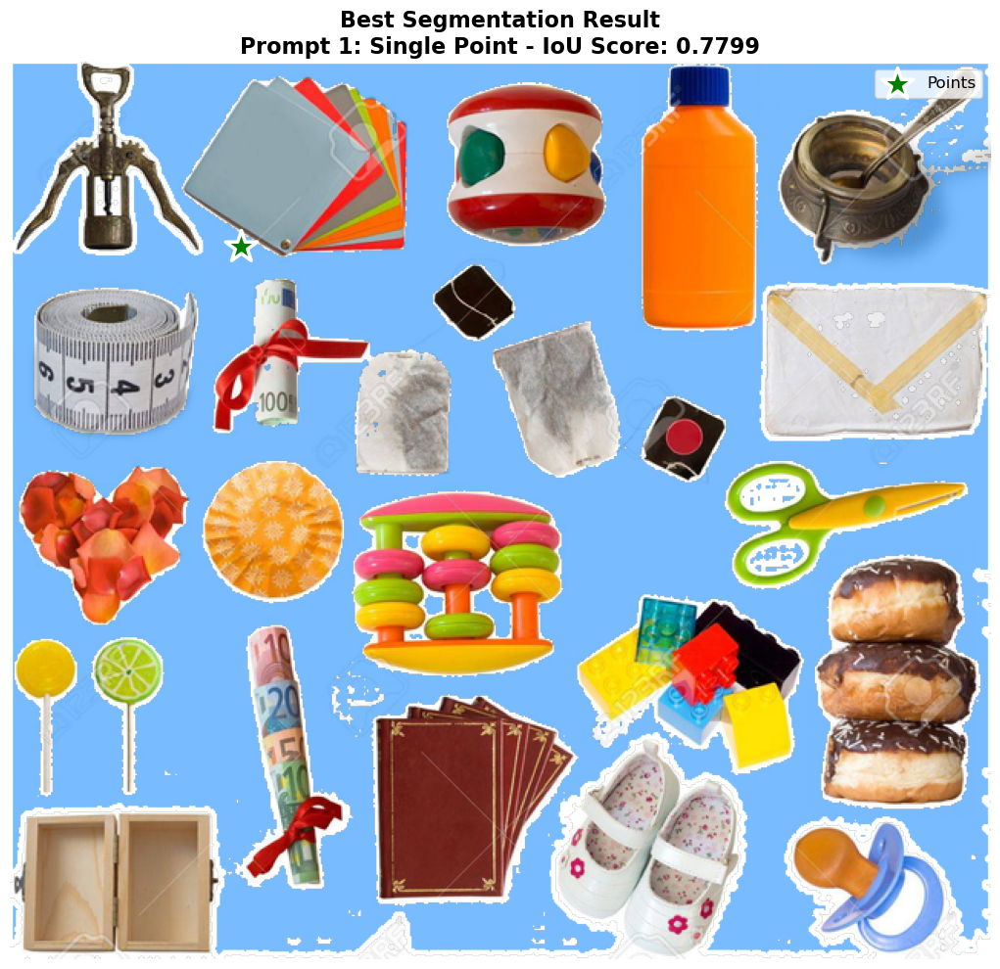

In [61]:
# Display the overall best result
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
ax.imshow(image)
show_mask(best_mask, ax, random_color=False, borders=True)

# Show the prompt that produced this result
if best_points is not None:
    ax.scatter(best_points[:, 0], best_points[:, 1], color='green', marker='*', 
               s=600, edgecolor='white', linewidth=2.5, label='Points')
if best_box is not None:
    x0, y0 = best_box[0], best_box[1]
    w, h = best_box[2] - best_box[0], best_box[3] - best_box[1]
    rect = plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor='none', linewidth=3, label='Box')
    ax.add_patch(rect)

ax.set_title(f'Best Segmentation Result\n{best_name} - IoU Score: {best_score:.4f}', 
             fontsize=16, fontweight='bold')
ax.axis('off')
if best_points is not None or best_box is not None:
    ax.legend(loc='upper right', fontsize=12)

plt.tight_layout()
plt.savefig('assignment_best_result.png', bbox_inches='tight', dpi=150)
print(f"\n✓ Saved best result to: assignment_best_result.png")
plt.show()

## Selecting objects with SAM 2

First, load the SAM 2 model and predictor. Change the path below to point to the SAM 2 checkpoint. Running on CUDA and using the default model are recommended for best results.

In [62]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

Process the image to produce an image embedding by calling `SAM2ImagePredictor.set_image`. `SAM2ImagePredictor` remembers this embedding and will use it for subsequent mask prediction.

In [63]:
predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [64]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

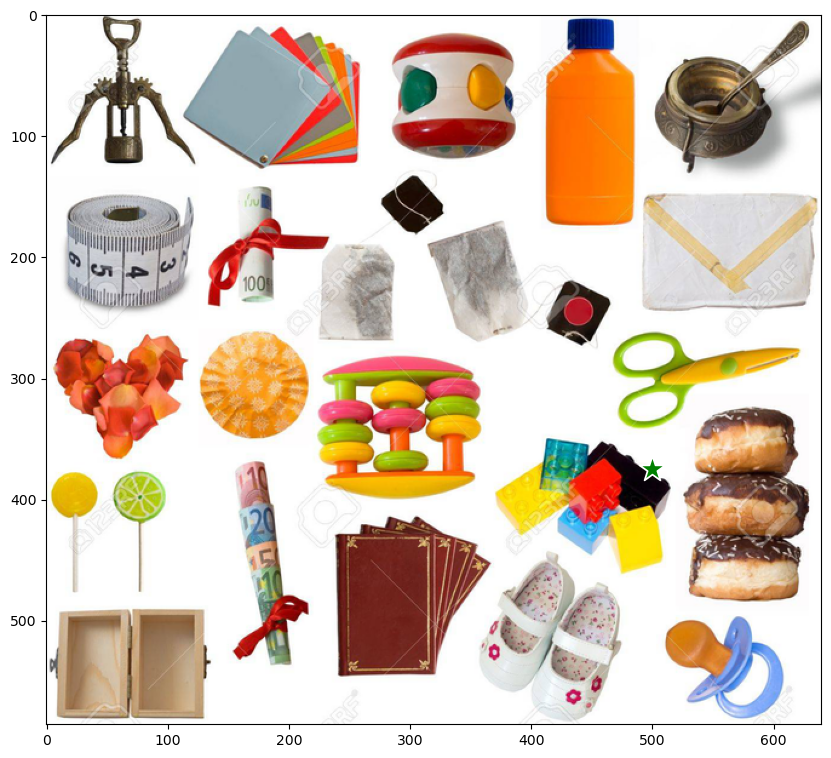

In [65]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [66]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


Predict with `SAM2ImagePredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [67]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

With `multimask_output=True` (the default setting), SAM 2 outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [68]:
masks.shape  # (number_of_masks) x H x W

(3, 586, 640)

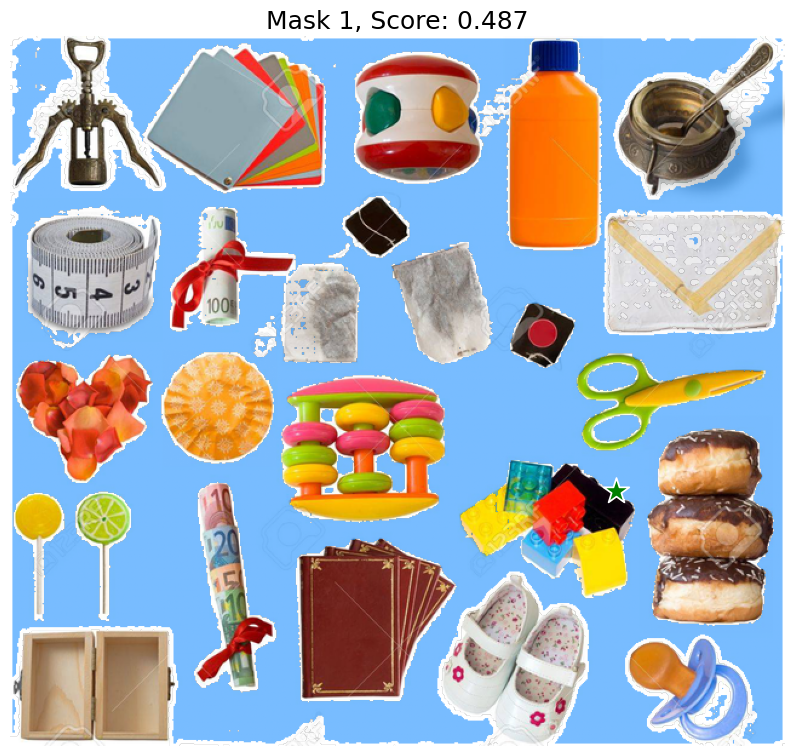

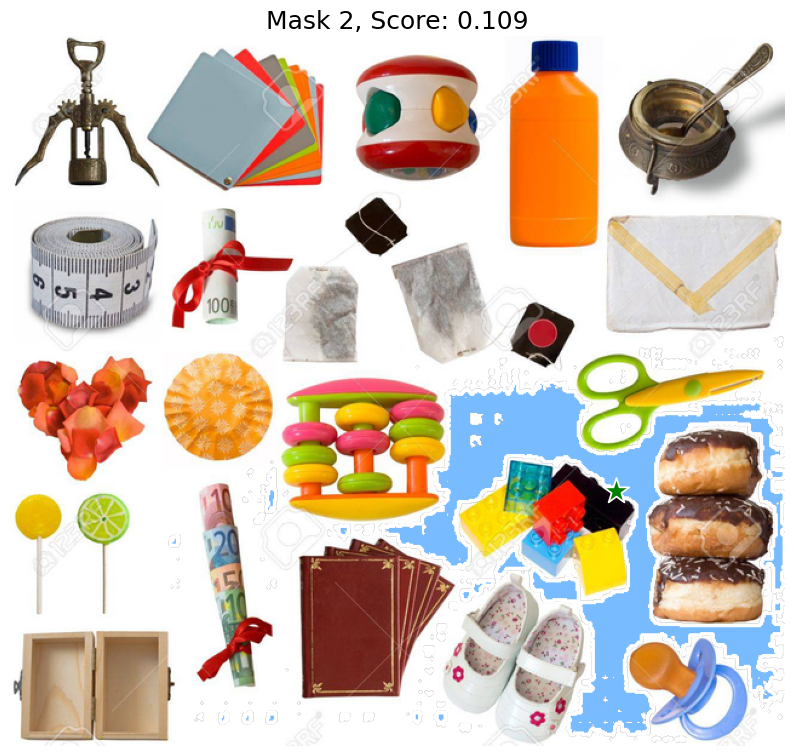

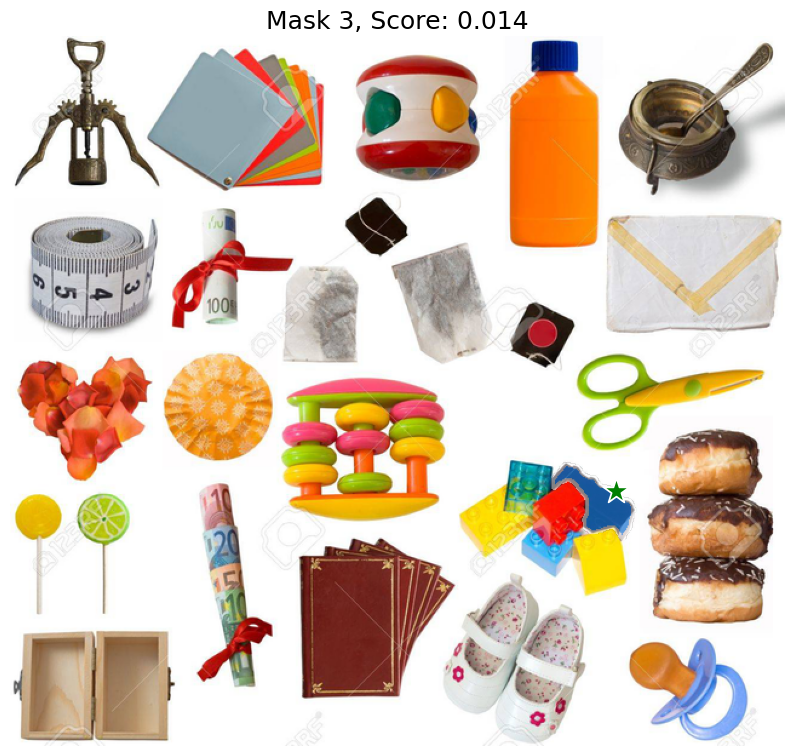

In [69]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label, borders=True)

## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided. If available, a mask from a previous iteration can also be supplied to the model to aid in prediction. When specifying a single object with multiple prompts, a single mask can be requested by setting `multimask_output=False`.

In [70]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [71]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [72]:
masks.shape

(1, 586, 640)

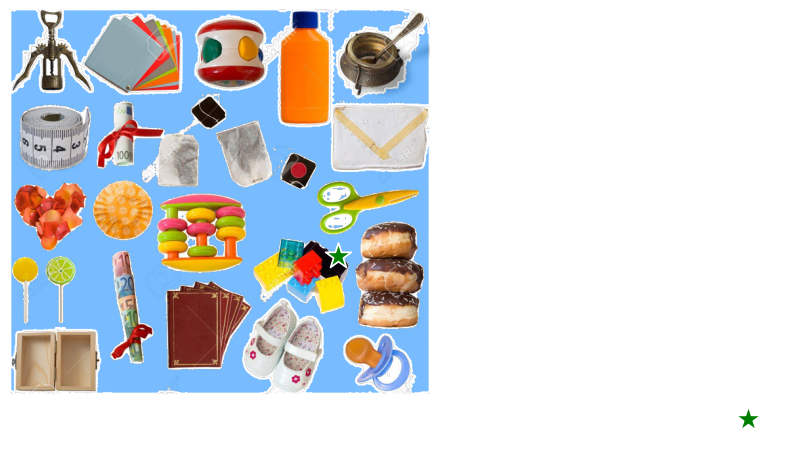

In [73]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label)

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [74]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [75]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

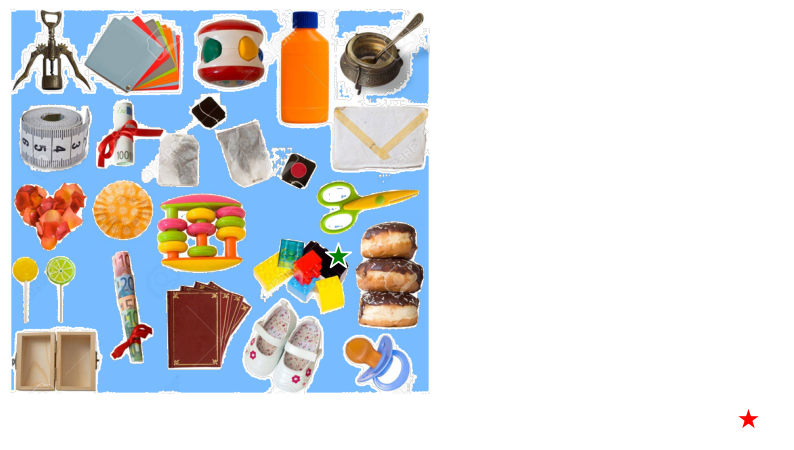

In [76]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label)

## Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [77]:
input_box = np.array([425, 600, 700, 875])

In [78]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

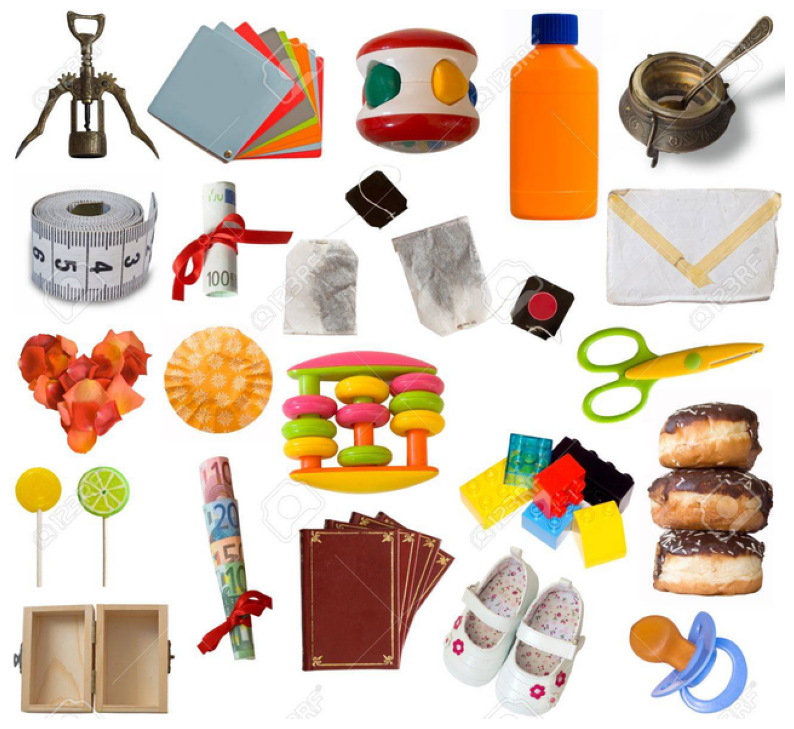

In [79]:
show_masks(image, masks, scores, box_coords=input_box)

## Combining points and boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [80]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [81]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

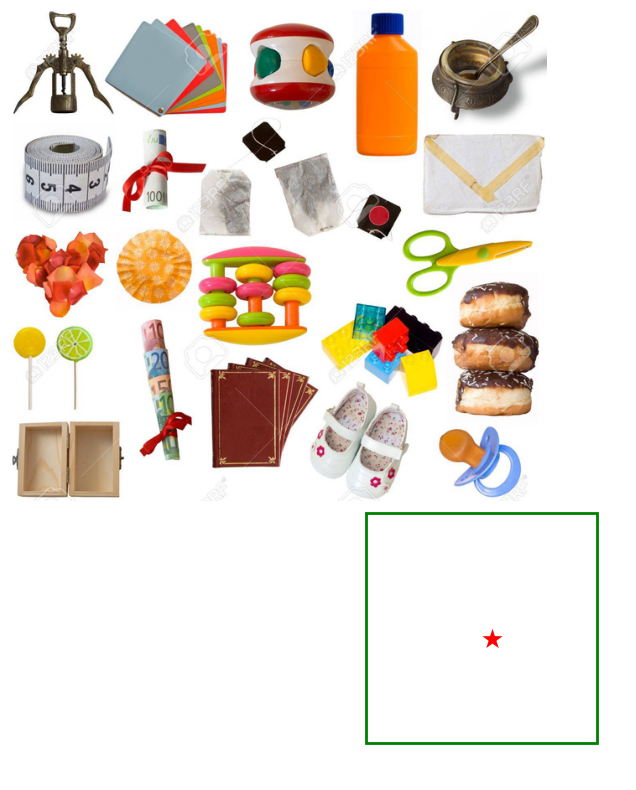

In [82]:
show_masks(image, masks, scores, box_coords=input_box, point_coords=input_point, input_labels=input_label)

## Batched prompt inputs

`SAM2ImagePredictor` can take multiple input prompts for the same image, using `predict` method. For example, imagine we have several box outputs from an object detector.

In [83]:
input_boxes = np.array([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

In [84]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_boxes,
    multimask_output=False,
)

In [85]:
masks.shape  # (batch_size) x (num_predicted_masks_per_input) x H x W

(4, 1, 586, 640)

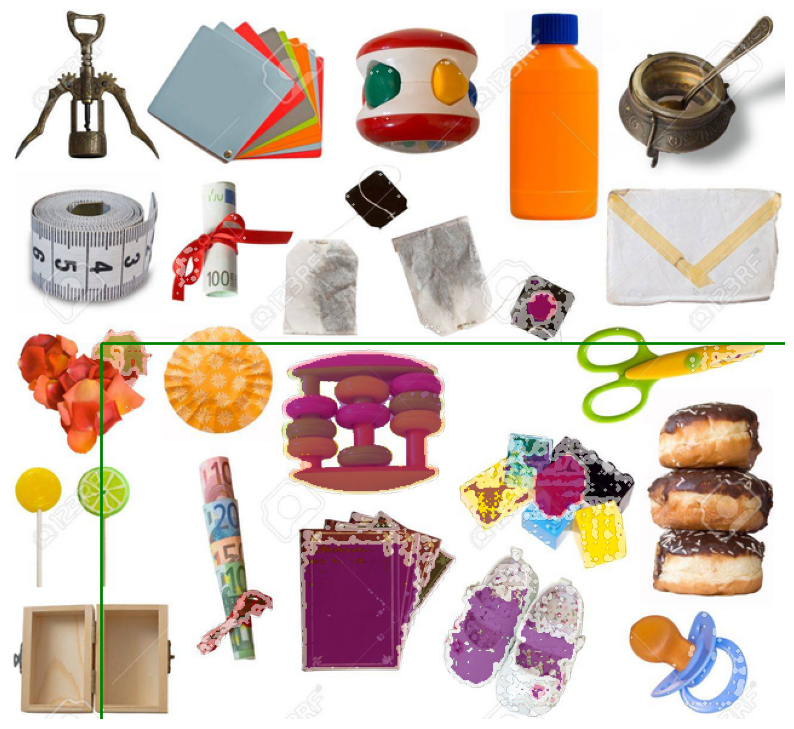

In [86]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.squeeze(0), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box, plt.gca())
plt.axis('off')
plt.show()

## End-to-end batched inference
If all prompts are available in advance, it is possible to run SAM 2 directly in an end-to-end fashion. This also allows batching over images.

In [87]:
# For batch processing - use the same image twice with different box prompts
# (In a real scenario, you would load different images)
image1 = image  # Use our resized image
image1_boxes = np.array([
    [50, 50, 300, 250],    # Box 1 - top left area
    [350, 100, 550, 300],   # Box 2 - middle area
    [400, 350, 600, 550],   # Box 3 - bottom middle
])

image2 = image  # Same image for demonstration
image2_boxes = np.array([
    [100, 200, 250, 400],   # Box 1
    [300, 300, 500, 500],   # Box 2
    [50, 400, 200, 550],    # Box 3
])

img_batch = [image1, image2]
boxes_batch = [image1_boxes, image2_boxes]

In [88]:
predictor.set_image_batch(img_batch)

In [89]:
masks_batch, scores_batch, _ = predictor.predict_batch(
    None,
    None,
    box_batch=boxes_batch,
    multimask_output=False
)

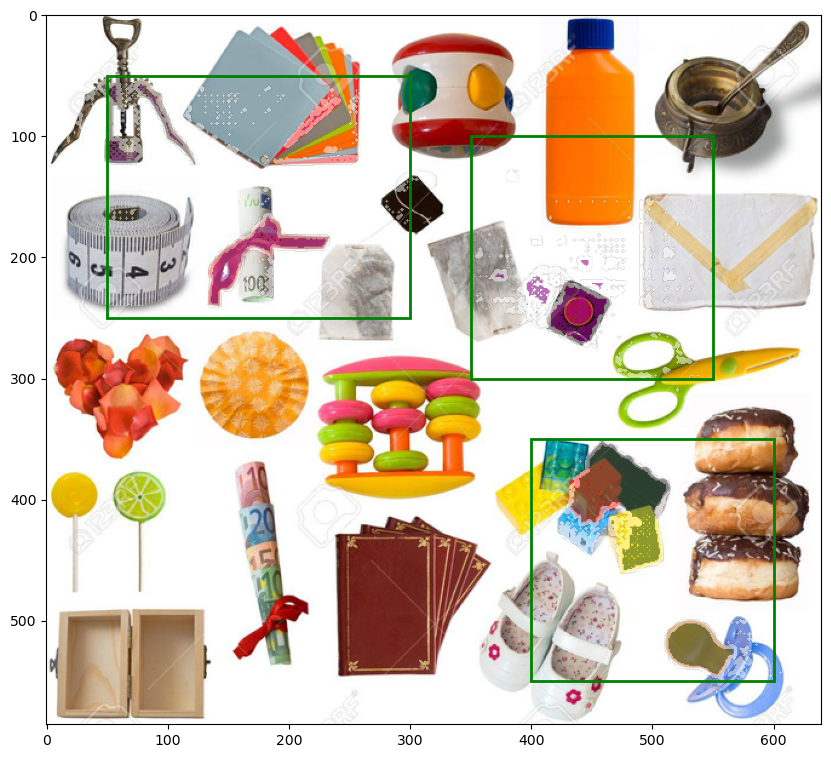

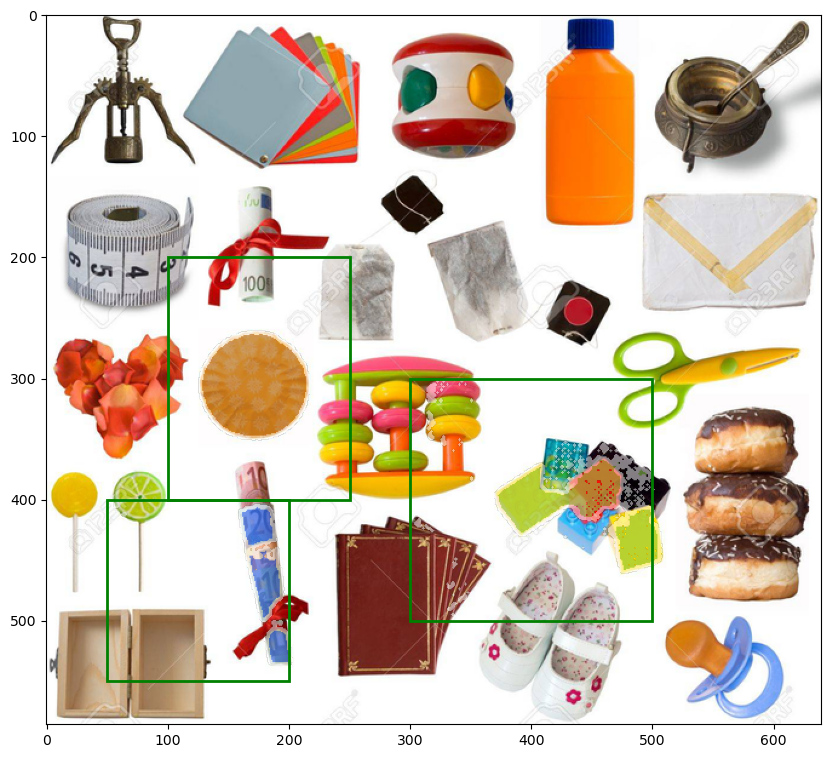

In [90]:
for image, boxes, masks in zip(img_batch, boxes_batch, masks_batch):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for mask in masks:
        show_mask(mask.squeeze(0), plt.gca(), random_color=True)
    for box in boxes:
        show_box(box, plt.gca())

Similarly, we can have a batch of point prompts defined over a batch of images

In [91]:
image1 = image  # truck.jpg from above
image1_pts = np.array([
    [[500, 375]],
    [[650, 750]]
    ]) # Bx1x2 where B corresponds to number of objects
image1_labels = np.array([[1], [1]])

image2_pts = np.array([
    [[400, 300]],
    [[630, 300]],
])
image2_labels = np.array([[1], [1]])

pts_batch = [image1_pts, image2_pts]
labels_batch = [image1_labels, image2_labels]

In [92]:
masks_batch, scores_batch, _ = predictor.predict_batch(pts_batch, labels_batch, box_batch=None, multimask_output=True)

# Select the best single mask per object
best_masks = []
for masks, scores in zip(masks_batch,scores_batch):
    best_masks.append(masks[range(len(masks)), np.argmax(scores, axis=-1)])

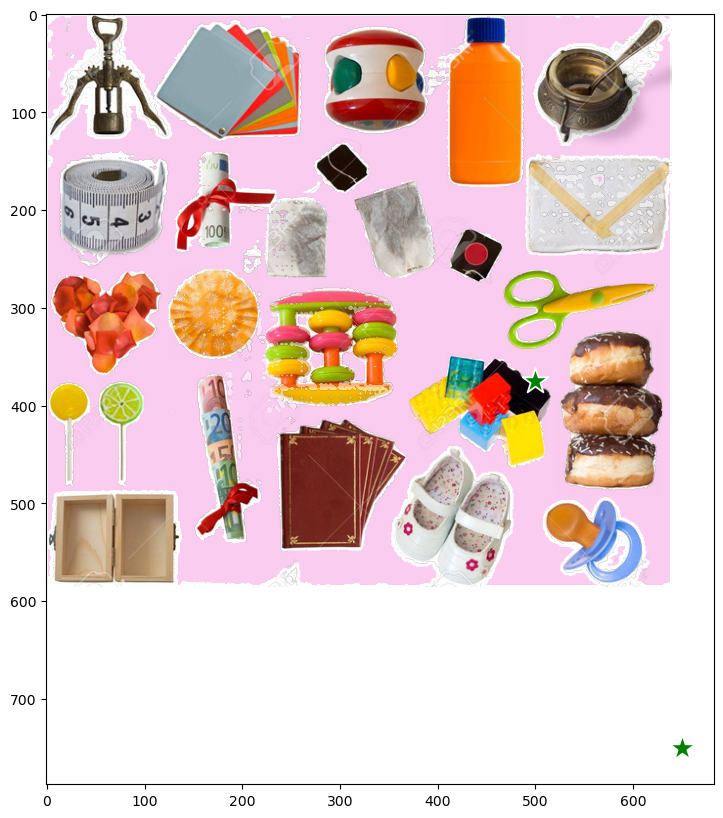

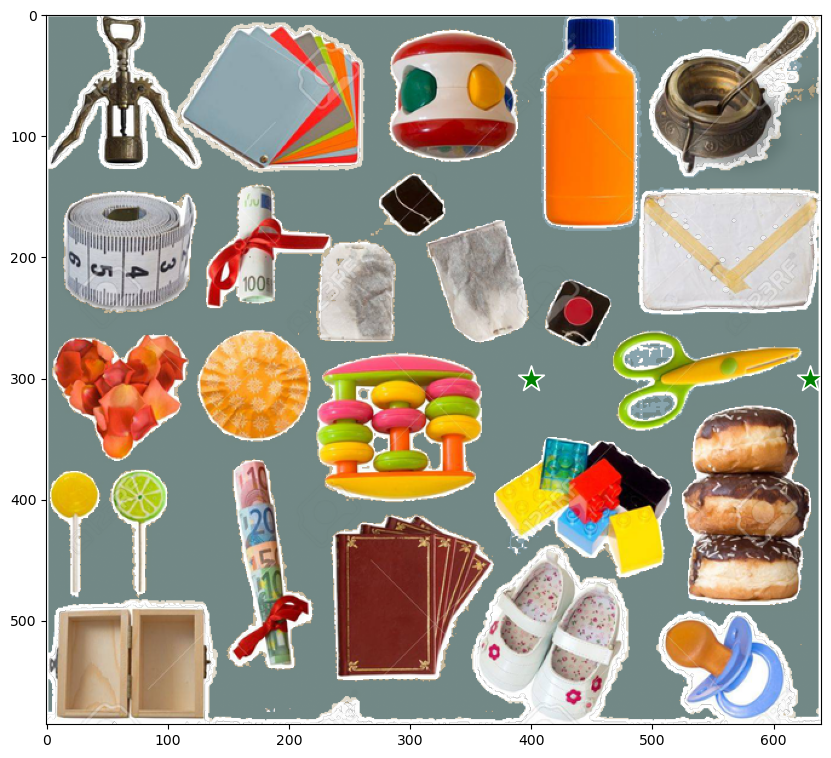

In [93]:
for image, points, labels, masks in zip(img_batch, pts_batch, labels_batch, best_masks):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for mask in masks:
        show_mask(mask, plt.gca(), random_color=True)
    show_points(points, labels, plt.gca())